In [1]:
import numpy as np
import pandas as pd
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.utils as vutils

from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingLR, StepLR, MultiStepLR, CyclicLR
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T, datasets as dset
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

from zipfile import ZipFile
from tqdm import tqdm
from glob import glob
from PIL import Image

In [2]:
batch_size = 16

n_iters = 10000
epochs = 10

learning_rate = 0.00002
n_workers = 8


width = 256
height = 256
channels = 3

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

seed = 44
random.seed(seed)
torch.manual_seed(seed)

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])


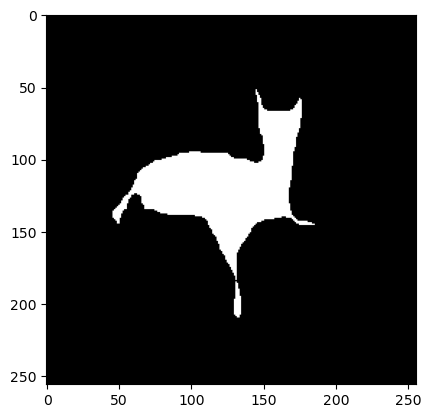

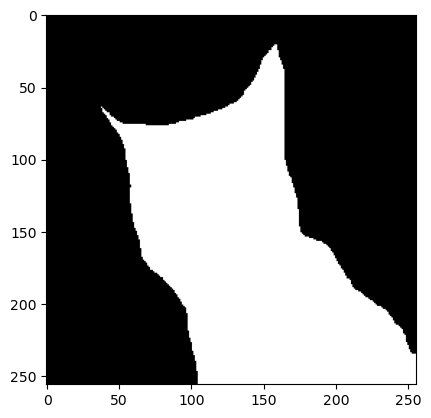

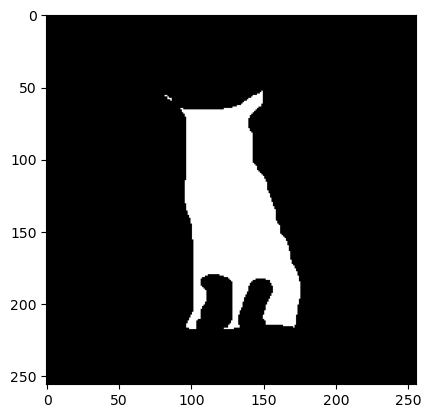

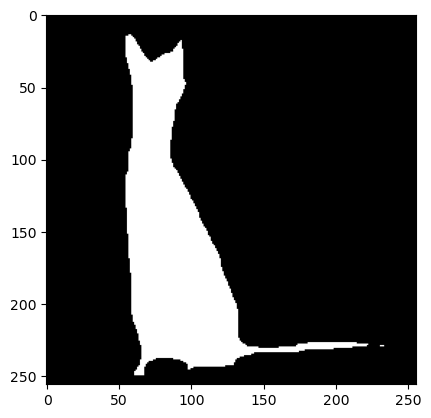

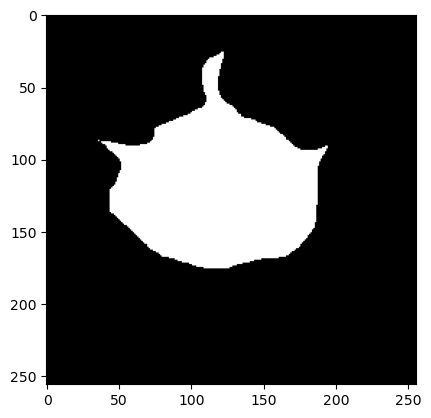

In [3]:
class MyDataset(Dataset):
    def __init__(self, root_dir: str, train=True, transforms=None):
        super(MyDataset, self).__init__()
        self.train = train
        self.transforms = transforms
        
        file_path = root_dir + 'images/*.*'
        file_mask_path = root_dir + 'annotations/trimaps/*.*'
        
        self.images = sorted(glob(file_path))
        self.image_mask = sorted(glob(file_mask_path))
        
        # manually split the train/valid data
        split_ratio = int(len(self.images) * 0.7)
        if train:
            self.images = self.images[:split_ratio]
            self.image_mask = self.image_mask[:split_ratio]
        else:
            self.images = self.images[split_ratio:]
            self.image_mask = self.image_mask[split_ratio:]
        
        
    def __getitem__(self, index: int):
        image = Image.open(self.images[index]).convert('RGB')
        image_mask = Image.open(self.image_mask[index]).convert('L')
        
        if self.transforms:
            image = self.transforms(image)
            image_mask = self.transforms(image_mask)
            binary_mask = torch.where((image_mask <= 0.007), torch.tensor(1.), torch.tensor(0.))

        return {'img': image, 'mask': binary_mask}
    
    def __len__(self):
        return len(self.images)
    

transforms = T.Compose([
    T.Resize((width, height)),
    T.ToTensor(),
#     T.Normalize(mean=[0.485, 0.456, 0.406],
#                 std=[0.229, 0.224, 0.225]),
#     T.RandomHorizontalFlip()
])
train_dataset = MyDataset(root_dir='./../data/',
                                 train=True,
                                 transforms=transforms)
val_dataset = MyDataset(root_dir='./../data/',
                                train=False,
                                transforms=transforms)

print(train_dataset[0]['mask'])

for i in [0, 10, 23, 100, 456]:
    plt.imshow(np.transpose(train_dataset[i]['mask'], (1, 2, 0)), cmap='gray')
    plt.show()

train_dataset_loader = DataLoader(dataset=train_dataset,
                                 batch_size=batch_size,
                                 shuffle=True,
                                 num_workers=n_workers)


val_dataset_loader = DataLoader(dataset=val_dataset,
                                batch_size=batch_size,
                                shuffle=True,
                                num_workers=n_workers)

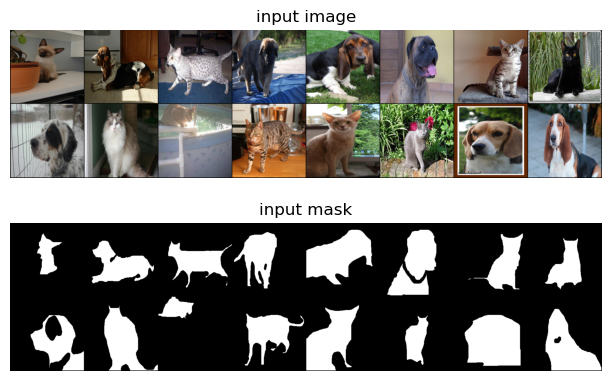

In [4]:
samples = next(iter(train_dataset_loader))

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 4))
fig.tight_layout()


ax1.axis('off')
ax1.set_title('input image')
ax1.imshow(np.transpose(vutils.make_grid(samples['img'], padding=2).numpy(),
                       (1, 2, 0)))

ax2.axis('off')
ax2.set_title('input mask')
ax2.imshow(np.transpose(vutils.make_grid(samples['mask'], padding=2).numpy(),
                       (1, 2, 0)), cmap='gray')

plt.show()

In [5]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, x: torch.Tensor):
        return self.block(x)
    
class CopyAndCrop(nn.Module):
    def forward(self, x: torch.Tensor, encoded: torch.Tensor):
        _, _, h, w = encoded.shape
        crop = T.CenterCrop((h, w))(x)
        output = torch.cat((x, crop), 1)
        
        return output

    
class UNet(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super(UNet, self).__init__()
        
        self.encoders = nn.ModuleList([
            ConvBlock(in_channels, 64),
            ConvBlock(64, 128),
            ConvBlock(128, 256),
            ConvBlock(256, 512),
        ])
        self.down_sample = nn.MaxPool2d(2)
        self.copyAndCrop = CopyAndCrop()
        self.decoders = nn.ModuleList([
            ConvBlock(1024, 512),
            ConvBlock(512, 256),
            ConvBlock(256, 128),
            ConvBlock(128, 64),
        ])
        
        # PixelShuffle, UpSample will modify the output channel (you can add extra operation to update the channel, e.g.conv2d)
        # preffer use convTranspose2d, it won't modify the output channel
        self.up_samples = nn.ModuleList([
            nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        ])

        
        self.bottleneck = ConvBlock(512, 1024)
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1, stride=1)
        
    def forward(self, x: torch.Tensor):
        # encod
        encoded_features = []
        for enc in self.encoders:
            x = enc(x)
            encoded_features.append(x)
            x = self.down_sample(x)
            
        
        x = self.bottleneck(x)
        
        # decode
        for idx, denc in enumerate(self.decoders):
            x = self.up_samples[idx](x)
            encoded = encoded_features.pop()
            x = self.copyAndCrop(x, encoded)
            x = denc(x)
            
        output = self.final_conv(x)
        return output

In [6]:
def dice_score(pred: torch.Tensor, mask: torch.Tensor):
    dice = (2 * (pred * mask).sum()) / (pred + mask).sum()
    return np.mean(dice.cpu().numpy())

def iou_score(pred: torch.Tensor, mask: torch.Tensor):
    pass

def pixel_accuracy(pred: torch.Tensor, mask: torch.Tensor):
    correct = torch.eq(pred, val_mask).int()
    return float(correct.sum()) / float(correct.numel())

In [7]:
def plot_pred_img(samples, pred):
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(12, 6))
    fig.tight_layout()


    ax1.axis('off')
    ax1.set_title('input image')
    ax1.imshow(np.transpose(vutils.make_grid(samples['img'], padding=2).numpy(),
                           (1, 2, 0)))

    ax2.axis('off')
    ax2.set_title('input mask')
    ax2.imshow(np.transpose(vutils.make_grid(samples['mask'], padding=2).numpy(),
                           (1, 2, 0)), cmap='gray')
    
    ax3.axis('off')
    ax3.set_title('predicted mask')
    ax3.imshow(np.transpose(vutils.make_grid(pred, padding=2).cpu().numpy(),
                           (1, 2, 0)), cmap='gray')

    plt.show()
    
    
def plot_train_progress(model):
#     model.eval()

#     with torch.no_grad():
    samples = next(iter(val_dataset_loader))
    val_img = samples['img'].to(device)
    val_mask = samples['mask'].to(device)

    pred = model(val_img)
    
    print(pred)


    plot_pred_img(samples, pred.detach())

In [8]:
def train(model, optimizer, criteration, scheduler=None):
    train_losses = []
    val_lossess = []
    lr_rates = []
    
    # calculate train epochs
    epochs = int(n_iters / (len(train_dataset) / batch_size))


    for epoch in range(epochs):
        model.train()        
        train_total_loss = 0
        train_iterations = 0
        
        for idx, data in enumerate(tqdm(train_dataset_loader)):
            train_iterations += 1
            train_img = data['img'].to(device)
            train_mask = data['mask'].to(device)
            
            optimizer.zero_grad()
            # speed up the training
            with torch.autocast(device_type='cuda'):
                train_output_mask = model(train_img)
                train_loss = criterion(train_output_mask, train_mask)
                train_total_loss += train_loss.item()

            train_loss.backward()
            optimizer.step()



        train_epoch_loss = train_total_loss / train_iterations
        train_losses.append(train_epoch_loss)
        
        # evaluate mode
        model.eval()
        with torch.no_grad():
            val_total_loss = 0
            val_iterations = 0
            scores = 0

            for vidx, val_data in enumerate(tqdm(val_dataset_loader)):
                val_iterations += 1
                val_img = val_data['img'].to(device)
                val_mask = val_data['mask'].to(device)

                with torch.autocast(device_type='cuda'):
                    pred = model(val_img)
                    val_loss = criterion(pred, val_mask)
                    val_total_loss += val_loss.item()
                    scores += dice_score(pred, val_mask)


            val_epoch_loss = val_total_loss / val_iterations
            dice_coef_scroe = scores / val_iterations

            val_lossess.append(val_epoch_loss)           

            plot_train_progress(model)
            print('epochs - {}/{} [{}/{}], dice score: {}, train loss: {}, val loss: {}'.format(
                epoch+1, epochs,
                idx+1, len(train_dataset_loader),
                dice_coef_scroe, train_epoch_loss, val_epoch_loss
            )) 
            
        lr_rates.append(optimizer.param_groups[0]['lr'])
        if scheduler:
            scheduler.step() # decay learning rate
            print('LR rate:', scheduler.get_last_lr())
            
    return {
        'lr': lr_rates,
        'train_loss': train_losses,
        'valid_loss': val_lossess
    }

100%|██████████| 139/139 [00:04<00:00, 31.45it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[ 0.0166, -0.1722, -0.3249,  ..., -0.1695, -0.2773,  0.1494],
          [-0.2390, -0.6178, -0.5526,  ..., -0.6205, -0.4872, -0.0385],
          [-0.3890, -0.5935, -0.7768,  ..., -0.6601, -0.7438, -0.0880],
          ...,
          [-0.2352, -0.6972, -0.6904,  ..., -0.6787, -0.5925, -0.0985],
          [-0.2742, -0.4793, -0.5692,  ..., -0.5805, -0.5587, -0.0488],
          [-0.1568, -0.4772, -0.5700,  ..., -0.4895, -0.5247,  0.0796]]],


        [[[ 0.0168, -0.1688, -0.3184,  ..., -0.1685, -0.2809,  0.1486],
          [-0.2380, -0.6150, -0.5467,  ..., -0.6276, -0.4882, -0.0422],
          [-0.3900, -0.5877, -0.7614,  ..., -0.6564, -0.7452, -0.0889],
          ...,
          [-0.2293, -0.7005, -0.6741,  ..., -0.6703, -0.5979, -0.1196],
          [-0.2760, -0.4798, -0.5642,  ..., -0.5388, -0.5710, -0.0516],
          [-0.1553, -0.4731, -0.5638,  ..., -0.4955, -0.5319,  0.0710]]],


        [[[ 0.0170, -0.1722, -0.3244,  ..., -0.1686, -0.2791,  0.1489],
          [-0.2390, -0.617

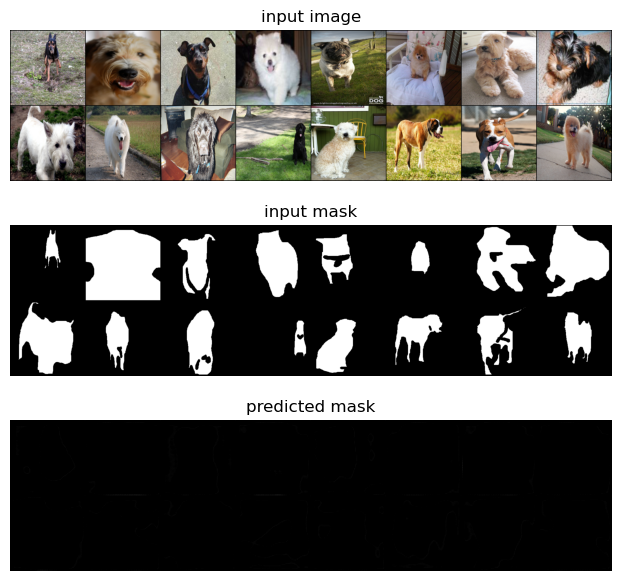

epochs - 1/30 [324/324], dice score: 0.7516428084253407, train loss: 0.5623204494700019, val loss: 0.794801033229279


100%|██████████| 139/139 [00:04<00:00, 30.26it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.3373, -0.5126, -0.5044,  ..., -0.5139, -0.4803, -0.3698],
          [-0.4825, -0.8156, -0.6453,  ..., -0.6854, -0.5964, -0.3893],
          [-0.5651, -0.7013, -0.6471,  ..., -0.7253, -0.6656, -0.4877],
          ...,
          [-0.4643, -0.7728, -0.6963,  ..., -0.6376, -0.6689, -0.3554],
          [-0.5412, -0.6466, -0.6136,  ..., -0.6618, -0.6418, -0.4664],
          [-0.4790, -0.6357, -0.6388,  ..., -0.5645, -0.6409, -0.2593]]],


        [[[-0.3372, -0.5125, -0.5044,  ..., -0.5139, -0.4802, -0.3699],
          [-0.4824, -0.8155, -0.6451,  ..., -0.6853, -0.5964, -0.3893],
          [-0.5649, -0.7013, -0.6472,  ..., -0.7252, -0.6655, -0.4877],
          ...,
          [-0.4624, -0.7708, -0.7226,  ..., -0.6373, -0.6693, -0.3554],
          [-0.5418, -0.6449, -0.6191,  ..., -0.6620, -0.6419, -0.4663],
          [-0.4801, -0.6299, -0.6353,  ..., -0.5644, -0.6410, -0.2592]]],


        [[[-0.3370, -0.5125, -0.5043,  ..., -0.5140, -0.4802, -0.3698],
          [-0.4824, -0.815

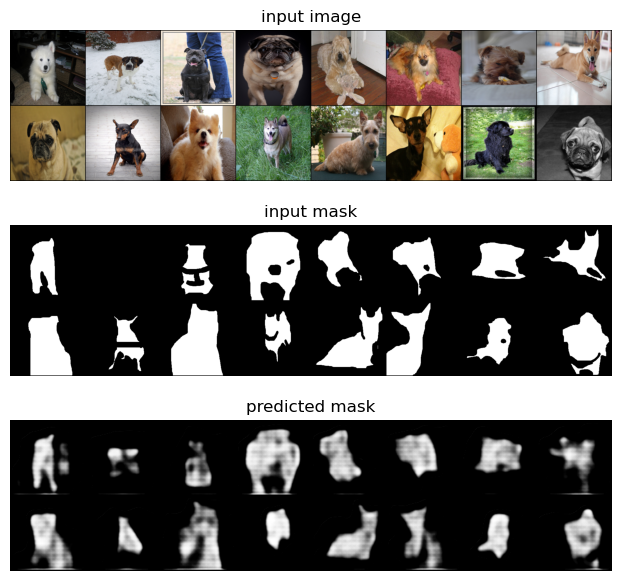

epochs - 2/30 [324/324], dice score: -0.16985760527502128, train loss: 0.512108631156109, val loss: 0.46219183836909505


100%|██████████| 139/139 [00:04<00:00, 30.05it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.6985, -0.8635, -0.8213,  ..., -0.8477, -0.9294, -0.8599],
          [-0.7361, -0.8676, -0.7331,  ..., -0.7489, -0.7775, -0.6413],
          [-0.8320, -0.7651, -0.7220,  ..., -0.7836, -0.8909, -0.8269],
          ...,
          [-0.6913, -0.8207, -0.8163,  ..., -0.6807, -0.8460, -0.6243],
          [-0.9021, -0.8690, -0.8439,  ..., -0.8556, -0.9449, -0.8058],
          [-0.7555, -0.7412, -0.7585,  ..., -0.6746, -0.7679, -0.6054]]],


        [[[-0.6984, -0.8639, -0.8214,  ..., -0.8475, -0.9293, -0.8600],
          [-0.7373, -0.8678, -0.7339,  ..., -0.7489, -0.7774, -0.6411],
          [-0.8327, -0.7666, -0.7241,  ..., -0.7834, -0.8906, -0.8268],
          ...,
          [-0.6845, -0.8130, -0.8082,  ..., -0.6755, -0.8485, -0.6265],
          [-0.9023, -0.8641, -0.8359,  ..., -0.8535, -0.9433, -0.8047],
          [-0.7558, -0.7392, -0.7540,  ..., -0.6757, -0.7681, -0.6051]]],


        [[[-0.6988, -0.8651, -0.8215,  ..., -0.8477, -0.9293, -0.8600],
          [-0.7384, -0.868

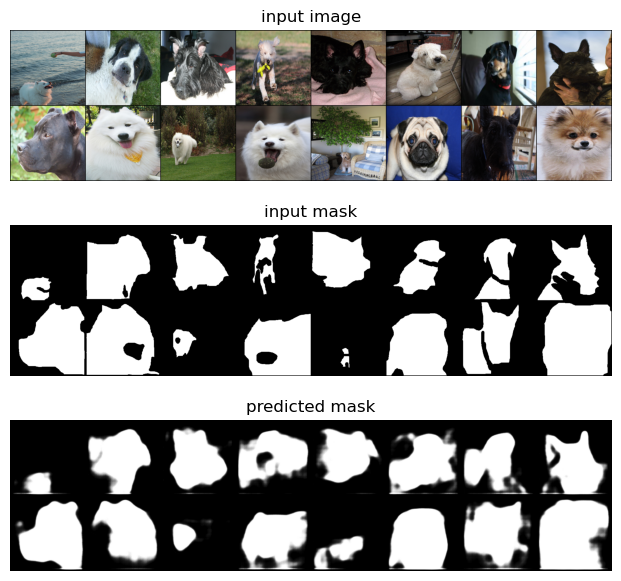

epochs - 3/30 [324/324], dice score: 2.0592275532029514, train loss: 0.48644470515442484, val loss: 0.4935247795187312


100%|██████████| 139/139 [00:04<00:00, 29.41it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.0527, -1.0331, -0.9718,  ..., -0.9634, -1.0670, -1.0487],
          [-1.0482, -1.0112, -0.8484,  ..., -0.9466, -0.8780, -0.9706],
          [-1.0765, -0.9820, -0.8747,  ..., -0.8737, -0.9230, -0.9761],
          ...,
          [-0.9788, -0.9365, -0.8346,  ..., -0.8087, -0.8226, -0.9646],
          [-1.0717, -0.9120, -0.7841,  ..., -0.8551, -0.8477, -0.9408],
          [-1.0744, -0.9777, -0.9802,  ..., -0.8973, -1.0326, -1.0678]]],


        [[[-1.0532, -1.0334, -0.9726,  ..., -0.9636, -1.0672, -1.0490],
          [-1.0488, -1.0109, -0.8494,  ..., -0.9466, -0.8787, -0.9706],
          [-1.0766, -0.9824, -0.8770,  ..., -0.8753, -0.9246, -0.9768],
          ...,
          [-0.9768, -0.9355, -0.8325,  ..., -0.8010, -0.8175, -0.9623],
          [-1.0698, -0.9087, -0.7804,  ..., -0.8482, -0.8411, -0.9382],
          [-1.0739, -0.9773, -0.9784,  ..., -0.8922, -1.0288, -1.0650]]],


        [[[-1.0524, -1.0329, -0.9719,  ..., -0.9631, -1.0673, -1.0489],
          [-1.0481, -1.010

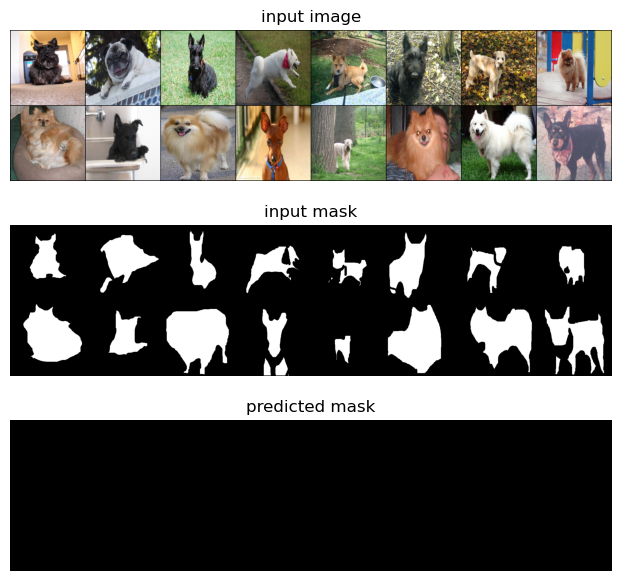

epochs - 4/30 [324/324], dice score: 0.9048973570624701, train loss: 0.4592418553836552, val loss: 0.6164159564663181


100%|██████████| 139/139 [00:04<00:00, 30.04it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.2928, -1.2392, -1.2073,  ..., -1.2436, -1.2068, -1.2559],
          [-1.2670, -1.1671, -1.1529,  ..., -1.1636, -1.1317, -1.2519],
          [-1.2785, -1.1143, -1.0425,  ..., -1.0888, -1.1225, -1.2125],
          ...,
          [-1.2034, -0.9782, -0.9685,  ..., -0.7962, -0.8885, -1.0499],
          [-1.2415, -0.9843, -0.9666,  ..., -0.8843, -1.0691, -1.0978],
          [-1.2757, -1.1458, -1.1189,  ..., -1.0172, -1.0899, -1.1910]]],


        [[[-1.2918, -1.2329, -1.1948,  ..., -1.2415, -1.2060, -1.2555],
          [-1.2634, -1.1630, -1.1347,  ..., -1.1585, -1.1288, -1.2506],
          [-1.2652, -1.0945, -1.0130,  ..., -1.0812, -1.1172, -1.2095],
          ...,
          [-1.2397, -1.0528, -1.0596,  ..., -0.9042, -0.9940, -1.1105],
          [-1.2601, -1.0392, -1.0553,  ..., -0.9659, -1.1034, -1.1392],
          [-1.2757, -1.1581, -1.1444,  ..., -1.0716, -1.1297, -1.2130]]],


        [[[-1.2930, -1.2384, -1.2052,  ..., -1.2441, -1.2071, -1.2561],
          [-1.2665, -1.166

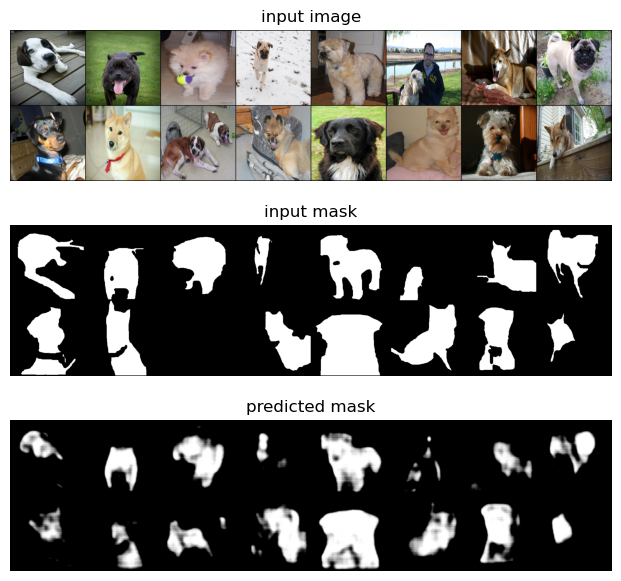

epochs - 5/30 [324/324], dice score: -0.3586879671356982, train loss: 0.4321238058216778, val loss: 0.4076759480743957


100%|██████████| 139/139 [00:04<00:00, 31.07it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.4855, -1.3615, -1.3162,  ..., -1.3253, -1.3208, -1.4415],
          [-1.4210, -1.2694, -1.2467,  ..., -1.1785, -1.2350, -1.2991],
          [-1.3837, -1.2307, -1.1654,  ..., -1.0614, -1.1432, -1.2656],
          ...,
          [-1.2559, -1.0388, -0.9111,  ..., -0.7704, -0.7210, -1.0579],
          [-1.2957, -1.0758, -0.9508,  ..., -0.6777, -0.9031, -1.1086],
          [-1.4108, -1.2526, -1.1630,  ..., -1.0455, -1.1200, -1.3514]]],


        [[[-1.4849, -1.3603, -1.3144,  ..., -1.3468, -1.3393, -1.4501],
          [-1.4201, -1.2674, -1.2437,  ..., -1.2233, -1.2699, -1.3180],
          [-1.3823, -1.2261, -1.1596,  ..., -1.1896, -1.2057, -1.3007],
          ...,
          [-1.2999, -1.1023, -0.9956,  ..., -0.9363, -0.9713, -1.1837],
          [-1.3231, -1.1284, -1.0114,  ..., -0.9292, -1.0705, -1.2094],
          [-1.4166, -1.2783, -1.2079,  ..., -1.1731, -1.2181, -1.3970]]],


        [[[-1.4858, -1.3622, -1.3173,  ..., -1.3473, -1.3401, -1.4503],
          [-1.4216, -1.270

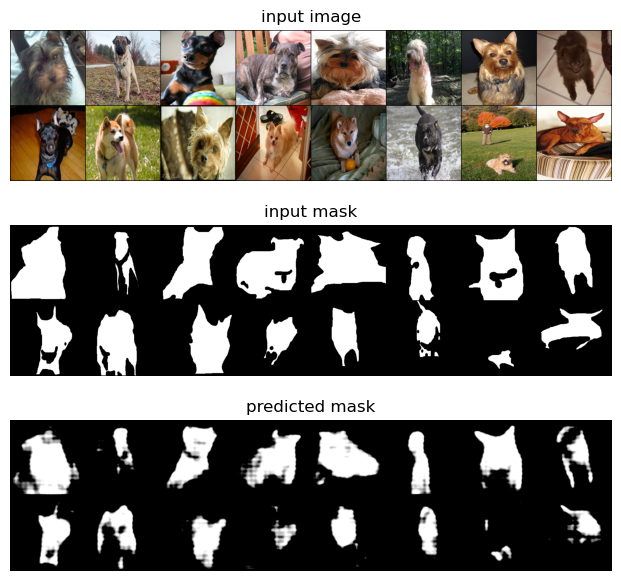

epochs - 6/30 [324/324], dice score: -1.0663445454707248, train loss: 0.4066083824928896, val loss: 0.399733768521453


100%|██████████| 139/139 [00:04<00:00, 30.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.6493, -1.5136, -1.4998,  ..., -1.5031, -1.5169, -1.6084],
          [-1.5254, -1.3328, -1.3603,  ..., -1.3483, -1.3751, -1.4213],
          [-1.4826, -1.2824, -1.2787,  ..., -1.2922, -1.3033, -1.3866],
          ...,
          [-1.4679, -1.2664, -1.2563,  ..., -1.2665, -1.2909, -1.3587],
          [-1.4580, -1.2404, -1.2365,  ..., -1.2375, -1.2880, -1.3752],
          [-1.5197, -1.3470, -1.2905,  ..., -1.2455, -1.3404, -1.4904]]],


        [[[-1.6487, -1.5121, -1.4992,  ..., -1.5067, -1.5198, -1.6096],
          [-1.5246, -1.3326, -1.3597,  ..., -1.3483, -1.3750, -1.4239],
          [-1.4811, -1.2821, -1.2773,  ..., -1.2926, -1.3045, -1.3902],
          ...,
          [-1.4655, -1.2758, -1.2799,  ..., -1.2587, -1.2845, -1.3552],
          [-1.4556, -1.2435, -1.2429,  ..., -1.2313, -1.2856, -1.3719],
          [-1.5204, -1.3467, -1.2921,  ..., -1.2356, -1.3325, -1.4872]]],


        [[[-1.6496, -1.5143, -1.5001,  ..., -1.5048, -1.5181, -1.6090],
          [-1.5257, -1.332

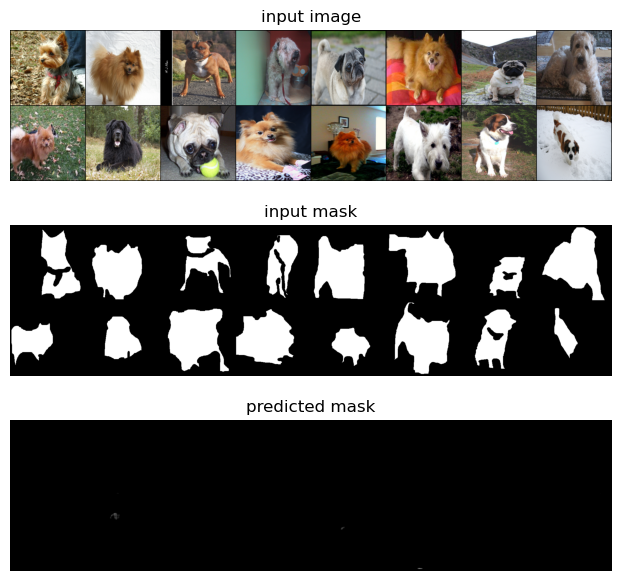

epochs - 7/30 [324/324], dice score: 0.6815895712632927, train loss: 0.37654582622610494, val loss: 0.5880909448476146


100%|██████████| 139/139 [00:04<00:00, 31.31it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.8188, -1.7244, -1.7639,  ..., -1.7504, -1.7422, -1.9326],
          [-1.3661, -1.2434, -1.3899,  ..., -1.3809, -1.2911, -1.5228],
          [-1.4041, -1.3097, -1.3933,  ..., -1.3791, -1.1872, -1.4684],
          ...,
          [-1.3908, -1.3295, -1.4667,  ..., -1.4624, -1.2684, -1.4867],
          [-1.3744, -1.2014, -1.3147,  ..., -1.2815, -1.0893, -1.3797],
          [-1.5586, -1.3685, -1.3490,  ..., -1.2636, -1.2650, -1.6937]]],


        [[[-1.8170, -1.7236, -1.7647,  ..., -1.7506, -1.7418, -1.9324],
          [-1.3645, -1.2536, -1.4003,  ..., -1.3792, -1.2907, -1.5229],
          [-1.4019, -1.3223, -1.4027,  ..., -1.3776, -1.1870, -1.4692],
          ...,
          [-1.4001, -1.3051, -1.4294,  ..., -1.3907, -1.2233, -1.4795],
          [-1.3902, -1.1942, -1.3034,  ..., -1.2428, -1.0724, -1.3872],
          [-1.5585, -1.3836, -1.3298,  ..., -1.2823, -1.2852, -1.7058]]],


        [[[-1.8187, -1.7245, -1.7638,  ..., -1.7511, -1.7417, -1.9324],
          [-1.3662, -1.243

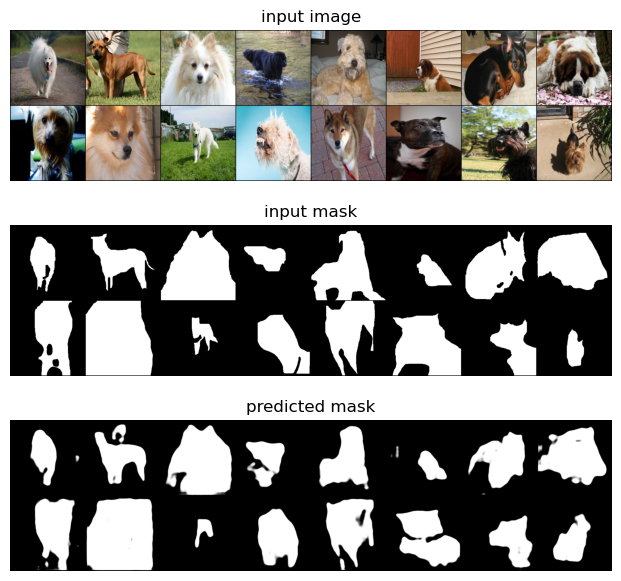

epochs - 8/30 [324/324], dice score: 23.649323510609086, train loss: 0.34424237189469514, val loss: 0.305578578504727


100%|██████████| 139/139 [00:04<00:00, 29.77it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.3510, -1.3918, -1.4935,  ..., -1.4867, -1.4772, -1.5228],
          [-1.0841, -1.0007, -1.2252,  ..., -1.2402, -1.0235, -1.3216],
          [-1.1936, -1.3012, -1.3670,  ..., -1.3877, -1.1526, -1.3624],
          ...,
          [-1.1859, -1.2790, -1.4177,  ..., -1.3825, -1.1926, -1.3140],
          [-1.1508, -1.1329, -1.2365,  ..., -1.2545, -0.9919, -1.1837],
          [-1.3262, -1.1818, -1.1721,  ..., -1.1172, -1.0668, -1.4745]]],


        [[[-1.3511, -1.3919, -1.4936,  ..., -1.4866, -1.4773, -1.5223],
          [-1.0842, -1.0012, -1.2259,  ..., -1.2388, -1.0219, -1.3208],
          [-1.1936, -1.3016, -1.3676,  ..., -1.3868, -1.1515, -1.3618],
          ...,
          [-1.1796, -1.3125, -1.4364,  ..., -1.3964, -1.2188, -1.3041],
          [-1.1441, -1.1547, -1.2470,  ..., -1.2639, -1.0040, -1.1797],
          [-1.3213, -1.1731, -1.1469,  ..., -1.0820, -1.0438, -1.4531]]],


        [[[-1.3511, -1.3919, -1.4936,  ..., -1.4868, -1.4772, -1.5230],
          [-1.0843, -1.001

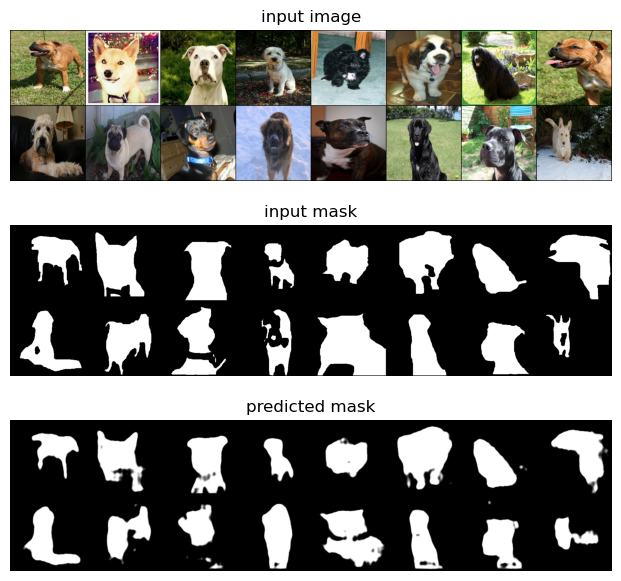

epochs - 9/30 [324/324], dice score: -1.3968607834774813, train loss: 0.32677787974660777, val loss: 0.32396250512960145


100%|██████████| 139/139 [00:04<00:00, 30.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.1951, -1.2692, -1.3605,  ..., -1.3259, -1.3486, -1.5336],
          [-0.8634, -1.0158, -1.1541,  ..., -1.2186, -0.9358, -1.1204],
          [-1.0552, -1.2709, -1.3656,  ..., -1.3964, -1.3023, -1.2903],
          ...,
          [-1.0267, -1.4148, -1.5505,  ..., -1.4832, -1.3792, -1.0352],
          [-1.0753, -1.2280, -1.3760,  ..., -1.2319, -1.1310, -1.0459],
          [-1.3487, -1.2859, -1.2475,  ..., -0.9199, -0.8265, -1.1822]]],


        [[[-1.1954, -1.2690, -1.3607,  ..., -1.3267, -1.3480, -1.5333],
          [-0.8634, -1.0146, -1.1528,  ..., -1.2162, -0.9311, -1.1187],
          [-1.0556, -1.2689, -1.3641,  ..., -1.3942, -1.2970, -1.2886],
          ...,
          [-1.0623, -1.3708, -1.5025,  ..., -1.6011, -1.4451, -1.2077],
          [-1.1008, -1.2122, -1.3722,  ..., -1.4638, -1.3114, -1.2020],
          [-1.3417, -1.2825, -1.3185,  ..., -1.2240, -1.0510, -1.2779]]],


        [[[-1.1955, -1.2687, -1.3602,  ..., -1.3257, -1.3482, -1.5332],
          [-0.8632, -1.014

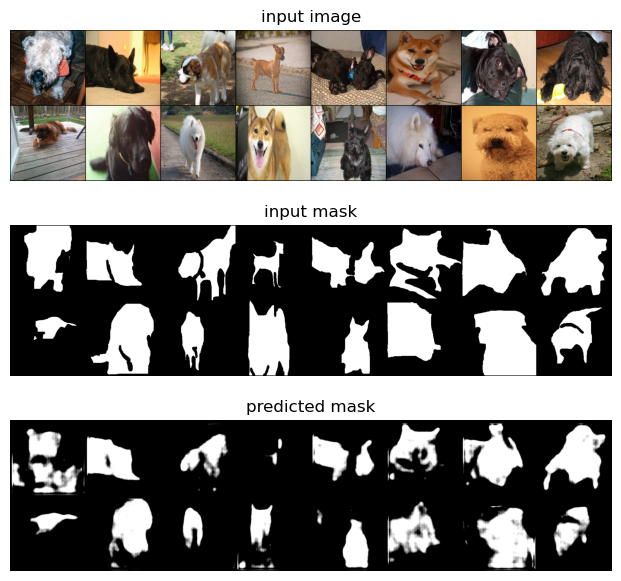

epochs - 10/30 [324/324], dice score: -0.12514891997339847, train loss: 0.31454687905900275, val loss: 0.36231305230435706


100%|██████████| 139/139 [00:04<00:00, 29.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.9666, -1.1591, -1.3076,  ..., -1.3062, -1.1710, -1.1608],
          [-0.8076, -1.0421, -1.3310,  ..., -1.3348, -1.1119, -0.9143],
          [-1.0214, -1.3409, -1.4496,  ..., -1.4514, -1.3885, -1.0337],
          ...,
          [-1.1993, -1.4587, -1.5897,  ..., -1.7581, -1.6655, -1.1522],
          [-1.1829, -1.3662, -1.4502,  ..., -1.5778, -1.5397, -1.0134],
          [-1.0572, -1.1928, -1.2713,  ..., -1.2570, -0.9856, -0.8069]]],


        [[[-0.9661, -1.1584, -1.3072,  ..., -1.3063, -1.1710, -1.1607],
          [-0.8069, -1.0406, -1.3306,  ..., -1.3348, -1.1115, -0.9141],
          [-1.0200, -1.3393, -1.4491,  ..., -1.4517, -1.3882, -1.0335],
          ...,
          [-1.1607, -1.4477, -1.5401,  ..., -1.5818, -1.5396, -1.0971],
          [-1.1177, -1.4096, -1.4258,  ..., -1.4722, -1.4369, -0.9143],
          [-0.9835, -1.0917, -1.2201,  ..., -1.1942, -0.8655, -0.8049]]],


        [[[-0.9661, -1.1586, -1.3072,  ..., -1.3074, -1.1716, -1.1614],
          [-0.8071, -1.041

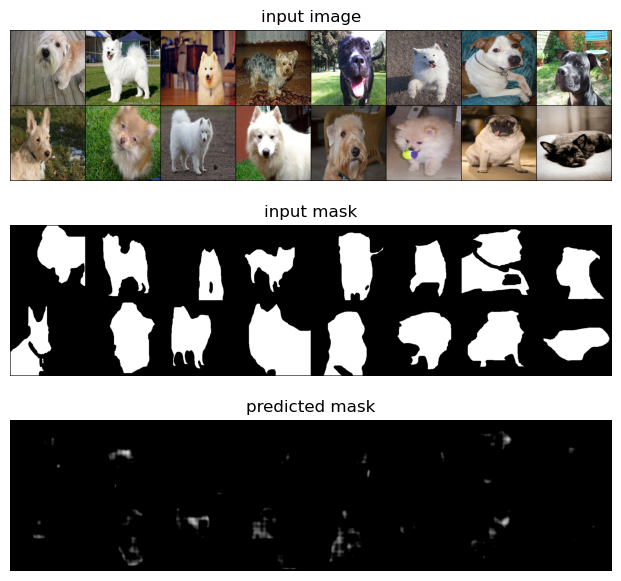

epochs - 11/30 [324/324], dice score: 0.4705905689181184, train loss: 0.29641466238248493, val loss: 0.4967367100201065


100%|██████████| 139/139 [00:04<00:00, 31.08it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.0862, -1.2098, -1.3603,  ..., -1.3336, -1.1348, -1.2484],
          [-0.8904, -1.0818, -1.3145,  ..., -1.3904, -1.0392, -0.9750],
          [-1.1164, -1.3344, -1.4897,  ..., -1.4546, -1.4061, -1.2219],
          ...,
          [-1.0271, -1.1563, -1.4020,  ..., -1.7148, -1.3275, -0.9204],
          [-1.1238, -0.9841, -1.1103,  ..., -1.2075, -1.0733, -0.8093],
          [-1.0218, -0.9834, -0.8829,  ..., -0.7916, -0.4959, -0.7105]]],


        [[[-1.0809, -1.2007, -1.3538,  ..., -1.3306, -1.1305, -1.2451],
          [-0.8816, -1.0677, -1.3077,  ..., -1.3902, -1.0369, -0.9732],
          [-1.1106, -1.3301, -1.4865,  ..., -1.4578, -1.4063, -1.2212],
          ...,
          [-1.2038, -1.2949, -1.4470,  ..., -1.9085, -1.5428, -1.0903],
          [-1.2178, -1.1387, -1.1938,  ..., -1.3961, -1.2552, -1.0314],
          [-1.0588, -1.0238, -1.0780,  ..., -0.8858, -0.7557, -0.8508]]],


        [[[-1.0803, -1.1995, -1.3523,  ..., -1.3321, -1.1251, -1.2412],
          [-0.8811, -1.066

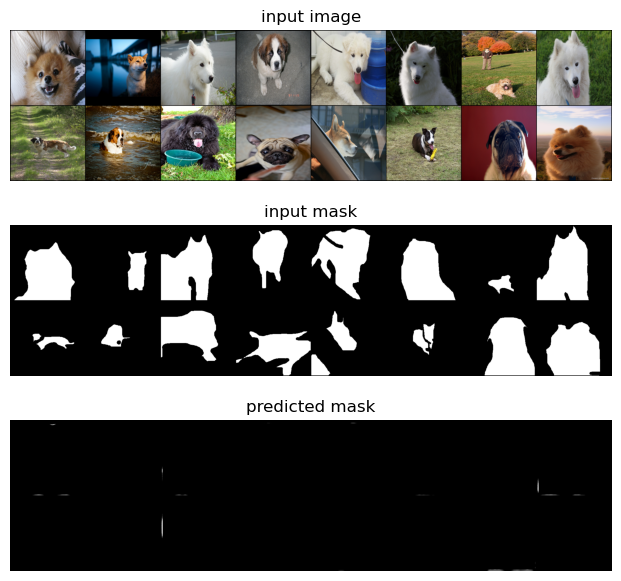

epochs - 12/30 [324/324], dice score: 0.6585340208286862, train loss: 0.28571764117589704, val loss: 2.5231535443299107


100%|██████████| 139/139 [00:04<00:00, 29.71it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.8022, -0.8839, -1.1522,  ..., -1.1964, -0.8406, -1.1634],
          [-0.6375, -0.6659, -1.2171,  ..., -1.2735, -0.7583, -0.7877],
          [-1.0257, -1.3332, -1.6709,  ..., -1.6973, -1.4158, -1.2497],
          ...,
          [-1.1961, -1.4540, -1.6665,  ..., -1.6959, -1.4974, -1.3180],
          [-1.0332, -1.1473, -1.4599,  ..., -1.4695, -1.3026, -1.0622],
          [-1.0516, -0.8697, -1.2412,  ..., -1.3918, -0.8216, -0.8031]]],


        [[[-0.8029, -0.8849, -1.1528,  ..., -1.1934, -0.8360, -1.1606],
          [-0.6376, -0.6662, -1.2162,  ..., -1.2670, -0.7474, -0.7829],
          [-1.0244, -1.3293, -1.6716,  ..., -1.6952, -1.3997, -1.2369],
          ...,
          [-1.2024, -1.4543, -1.6668,  ..., -1.7236, -1.5265, -1.3561],
          [-1.0491, -1.1607, -1.4676,  ..., -1.5218, -1.3767, -1.1136],
          [-1.0599, -0.8854, -1.2656,  ..., -1.4434, -0.9055, -0.8418]]],


        [[[-0.8047, -0.8889, -1.1531,  ..., -1.2011, -0.8458, -1.1657],
          [-0.6407, -0.673

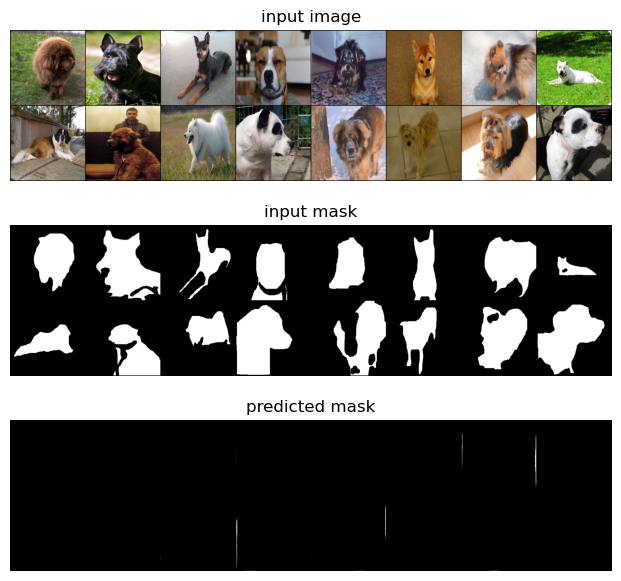

epochs - 13/30 [324/324], dice score: 0.7113864408980171, train loss: 0.2757703626045474, val loss: 2.741036215274454


100%|██████████| 139/139 [00:04<00:00, 31.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.1406, -1.2136, -1.4719,  ..., -1.5185, -1.2033, -1.5284],
          [-0.9086, -1.0156, -1.3087,  ..., -1.2907, -0.9258, -0.9388],
          [-1.2204, -1.4732, -1.6453,  ..., -1.6671, -1.4847, -1.3431],
          ...,
          [-1.1841, -1.4637, -1.4781,  ..., -1.7010, -1.4680, -1.1381],
          [-1.0592, -1.1141, -1.1841,  ..., -1.3374, -1.1377, -0.9187],
          [-1.0859, -0.9223, -1.0377,  ..., -1.2209, -0.7551, -0.8752]]],


        [[[-1.1381, -1.2102, -1.4696,  ..., -1.5183, -1.2037, -1.5301],
          [-0.9062, -1.0100, -1.3073,  ..., -1.2888, -0.9286, -0.9418],
          [-1.2179, -1.4715, -1.6450,  ..., -1.6669, -1.4880, -1.3474],
          ...,
          [-1.2387, -1.5552, -1.7172,  ..., -1.7297, -1.5445, -1.2496],
          [-1.0685, -1.1778, -1.3870,  ..., -1.4813, -1.2907, -1.1073],
          [-1.0818, -0.9490, -1.1884,  ..., -1.3287, -1.0057, -1.0263]]],


        [[[-1.1515, -1.2279, -1.4770,  ..., -1.5183, -1.2032, -1.5283],
          [-0.9234, -1.037

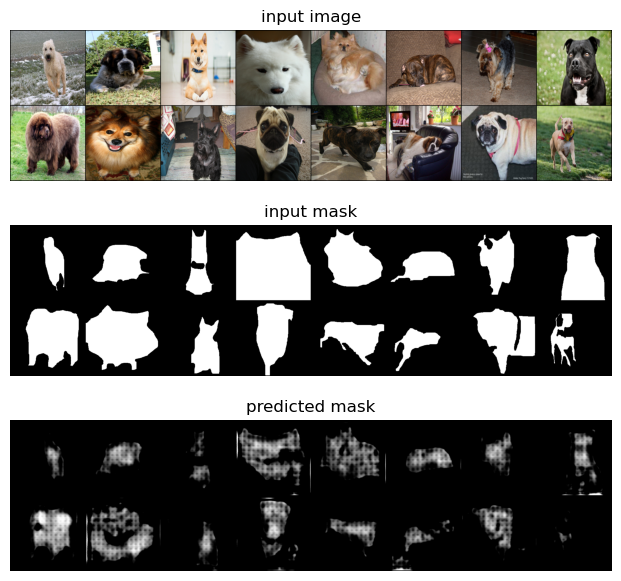

epochs - 14/30 [324/324], dice score: 0.1726344344641665, train loss: 0.2682596022884051, val loss: 0.43573621537187973


100%|██████████| 139/139 [00:04<00:00, 30.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.2602, -1.5635, -1.6554,  ..., -1.6987, -1.3610, -1.7366],
          [-1.1066, -1.1113, -1.5017,  ..., -1.4175, -1.1477, -1.2190],
          [-1.4670, -1.5810, -1.6292,  ..., -1.6560, -1.4938, -1.4648],
          ...,
          [-1.3787, -1.4695, -1.5107,  ..., -1.6435, -1.4238, -1.3768],
          [-1.2979, -1.2051, -1.2807,  ..., -1.5903, -1.2064, -1.1697],
          [-1.5177, -1.2045, -1.2763,  ..., -1.4775, -0.9884, -1.0241]]],


        [[[-1.2575, -1.5594, -1.6540,  ..., -1.7041, -1.3702, -1.7383],
          [-1.1022, -1.1081, -1.4999,  ..., -1.4151, -1.1504, -1.2239],
          [-1.4640, -1.5772, -1.6299,  ..., -1.6548, -1.4986, -1.4710],
          ...,
          [-1.3208, -1.2062, -1.1787,  ..., -1.5687, -1.3558, -1.3656],
          [-1.2246, -1.0260, -0.9477,  ..., -1.4410, -1.1339, -1.1840],
          [-1.4628, -1.0265, -1.1880,  ..., -1.4022, -0.9579, -1.0421]]],


        [[[-1.2603, -1.5636, -1.6554,  ..., -1.7021, -1.3646, -1.7380],
          [-1.1065, -1.111

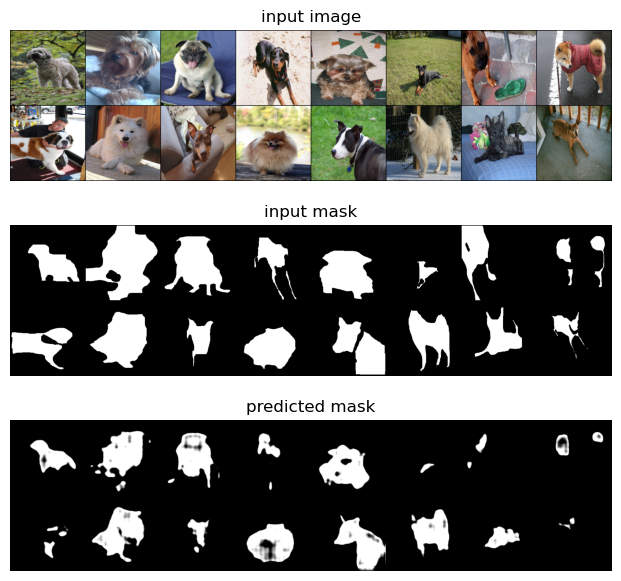

epochs - 15/30 [324/324], dice score: 0.0810516525827107, train loss: 0.26106338874425417, val loss: 0.42857531570702145


100%|██████████| 139/139 [00:04<00:00, 30.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.5521, -1.5470, -1.6571,  ..., -1.7078, -1.5784, -1.8029],
          [-1.3747, -1.2179, -1.4749,  ..., -1.4758, -1.3374, -1.3641],
          [-1.6872, -1.6417, -1.7754,  ..., -1.7659, -1.7398, -1.6479],
          ...,
          [-0.8767, -0.3523, -1.2770,  ..., -1.3362, -0.9242, -1.3426],
          [-1.1551, -0.4033, -0.8320,  ..., -1.0706, -0.9378, -1.2675],
          [-1.4973, -0.8141, -1.0291,  ..., -1.0667, -1.1725, -1.2679]]],


        [[[-1.5528, -1.5492, -1.6579,  ..., -1.7099, -1.5801, -1.8035],
          [-1.3751, -1.2228, -1.4774,  ..., -1.4789, -1.3389, -1.3649],
          [-1.6883, -1.6459, -1.7771,  ..., -1.7674, -1.7424, -1.6498],
          ...,
          [-1.6513, -1.4391, -1.6154,  ..., -1.9254, -1.7902, -1.7325],
          [-1.6123, -1.4132, -1.5304,  ..., -1.9833, -1.6569, -1.5835],
          [-1.7872, -1.4650, -1.6632,  ..., -1.7806, -1.5267, -1.3484]]],


        [[[-1.5504, -1.5414, -1.6550,  ..., -1.7054, -1.5770, -1.8013],
          [-1.3724, -1.208

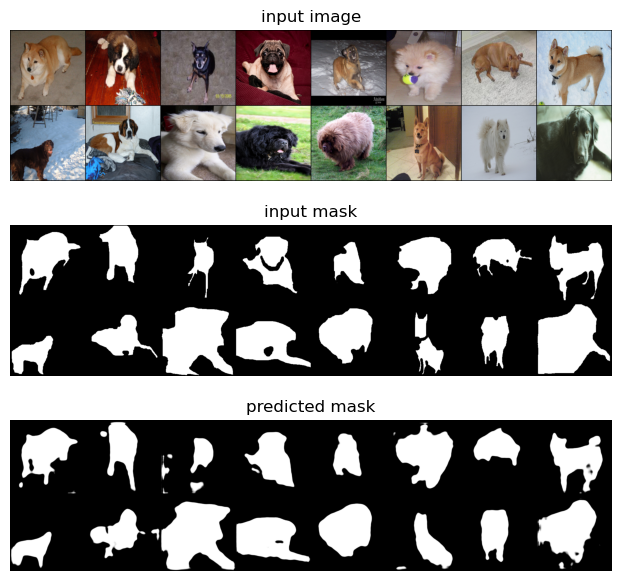

epochs - 16/30 [324/324], dice score: -2.066623884139301, train loss: 0.24578844102812403, val loss: 0.2592032179772425


100%|██████████| 139/139 [00:04<00:00, 29.31it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.5397, -1.4915, -1.7124,  ..., -1.6597, -1.5851, -1.5346],
          [-1.3166, -1.2359, -1.5087,  ..., -1.5178, -1.4262, -1.1454],
          [-1.6713, -1.7067, -1.8706,  ..., -1.8196, -1.8519, -1.3451],
          ...,
          [-1.5449, -1.3825, -1.4919,  ..., -2.0612, -1.8488, -1.3899],
          [-1.6258, -1.4334, -1.4403,  ..., -1.9173, -1.5852, -1.1844],
          [-1.7557, -1.6112, -1.7057,  ..., -1.8842, -1.4909, -0.9701]]],


        [[[-1.5359, -1.4829, -1.7080,  ..., -1.6524, -1.5667, -1.5255],
          [-1.3125, -1.2261, -1.5014,  ..., -1.5129, -1.4022, -1.1288],
          [-1.6684, -1.7010, -1.8650,  ..., -1.8369, -1.8274, -1.3285],
          ...,
          [-1.3651, -1.0835, -1.5726,  ..., -1.9049, -1.3007, -1.0713],
          [-1.5134, -1.2151, -1.2250,  ..., -1.3588, -0.9109, -0.7724],
          [-1.6839, -1.4574, -1.5926,  ..., -1.2765, -0.9896, -0.7238]]],


        [[[-1.5447, -1.4999, -1.7139,  ..., -1.6495, -1.5766, -1.5303],
          [-1.3223, -1.248

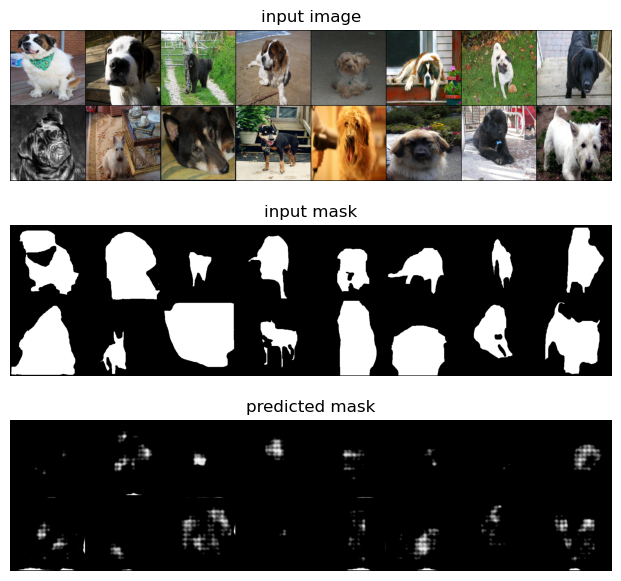

epochs - 17/30 [324/324], dice score: 0.2561041494067624, train loss: 0.23291681348173707, val loss: 0.94480064918669


100%|██████████| 139/139 [00:04<00:00, 31.12it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.5187, -1.3827, -1.6919,  ..., -1.6688, -1.4570, -1.3795],
          [-1.1287, -1.0693, -1.4234,  ..., -1.4541, -1.1492, -0.8745],
          [-1.4891, -1.6914, -1.9183,  ..., -1.9470, -1.6368, -0.9446],
          ...,
          [-0.9658, -1.2106, -2.7980,  ..., -2.1507, -1.6800, -1.0486],
          [-1.1006, -0.8289, -1.3679,  ..., -1.5849, -1.1418, -0.7097],
          [-1.4608, -1.1290, -1.5214,  ..., -1.5467, -1.0503, -0.6870]]],


        [[[-1.5218, -1.3839, -1.6958,  ..., -1.6710, -1.4599, -1.3805],
          [-1.1272, -1.0717, -1.4236,  ..., -1.4550, -1.1481, -0.8732],
          [-1.4896, -1.6952, -1.9184,  ..., -1.9443, -1.6309, -0.9404],
          ...,
          [-1.4374, -1.4691, -1.6443,  ..., -1.9689, -1.6253, -1.0187],
          [-1.3016, -1.1448, -1.3421,  ..., -1.4517, -1.1592, -0.7273],
          [-1.4366, -1.2853, -1.4603,  ..., -1.4330, -1.0545, -0.6750]]],


        [[[-1.5160, -1.3814, -1.6882,  ..., -1.6652, -1.4546, -1.3788],
          [-1.1307, -1.066

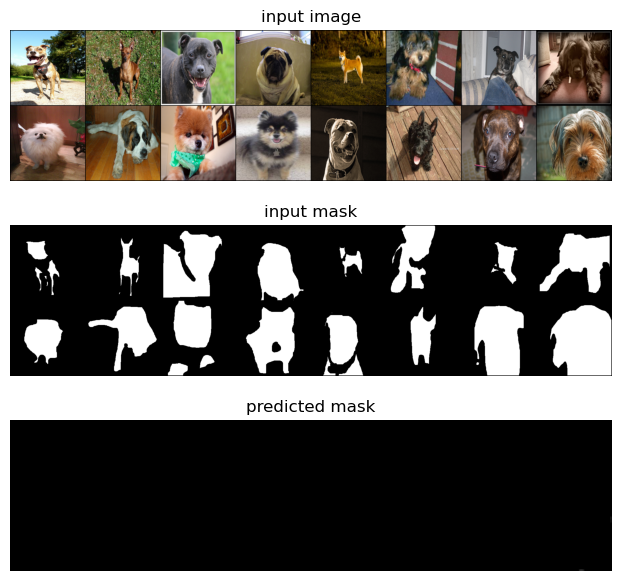

epochs - 18/30 [324/324], dice score: 0.6001393344762515, train loss: 0.22207195238198763, val loss: 3.8097245624597122


100%|██████████| 139/139 [00:04<00:00, 29.04it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.6661, -1.5152, -1.7664,  ..., -1.7329, -1.4675, -1.6167],
          [-1.6566, -1.2564, -1.6125,  ..., -1.6575, -0.9834, -1.0288],
          [-1.8370, -1.5903, -1.8977,  ..., -1.8932, -1.4972, -1.1719],
          ...,
          [-0.8692, -0.1897, -0.3077,  ..., -1.6734, -1.0667, -1.0065],
          [-0.8057, -0.2031, -0.1921,  ..., -1.1205, -0.8435, -0.8739],
          [-1.0922, -0.4897, -0.3413,  ..., -1.2928, -1.0051, -1.0625]]],


        [[[-1.6677, -1.5166, -1.7663,  ..., -1.7342, -1.4700, -1.6187],
          [-1.6597, -1.2599, -1.6145,  ..., -1.6606, -0.9889, -1.0290],
          [-1.8422, -1.6028, -1.9016,  ..., -1.8980, -1.5035, -1.1732],
          ...,
          [-1.6594, -1.2820, -1.5297,  ..., -1.8470, -1.3593, -1.0964],
          [-1.5378, -1.1148, -1.1900,  ..., -1.4380, -1.1593, -0.9826],
          [-1.6025, -1.3284, -1.3202,  ..., -1.4860, -1.1809, -1.1125]]],


        [[[-1.6655, -1.5147, -1.7660,  ..., -1.7343, -1.4702, -1.6185],
          [-1.6555, -1.255

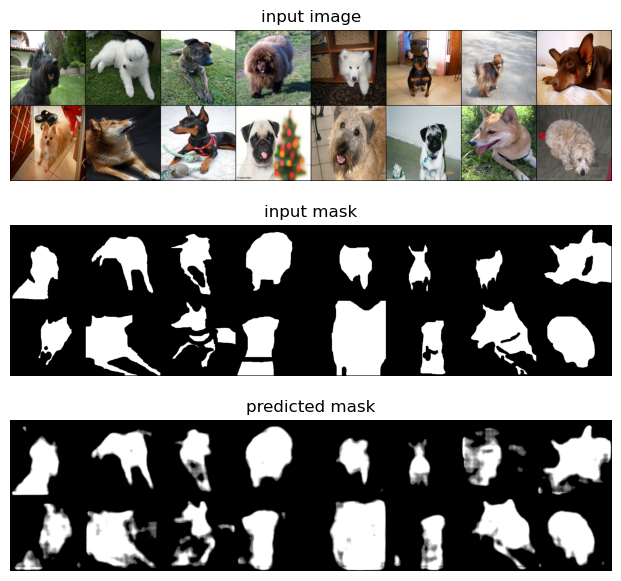

epochs - 19/30 [324/324], dice score: -1.2786106398637347, train loss: 0.2150463360235279, val loss: 0.2798943102574177


100%|██████████| 139/139 [00:04<00:00, 29.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.3500, -1.3263, -1.5069,  ..., -1.5175, -1.3805, -1.3433],
          [-1.3888, -1.2616, -1.4425,  ..., -1.5049, -1.1517, -1.3152],
          [-1.5071, -1.5216, -1.7222,  ..., -1.7736, -1.4638, -1.3678],
          ...,
          [-1.1846, -1.0424, -1.0751,  ..., -1.4977, -1.2085, -1.2289],
          [-1.2148, -0.9418, -1.0381,  ..., -1.2137, -0.9431, -1.0390],
          [-1.1940, -1.1488, -1.2153,  ..., -1.3061, -1.1915, -1.2640]]],


        [[[-1.3495, -1.3252, -1.5061,  ..., -1.5136, -1.3769, -1.3410],
          [-1.3870, -1.2590, -1.4394,  ..., -1.4974, -1.1465, -1.3124],
          [-1.5050, -1.5178, -1.7171,  ..., -1.7645, -1.4577, -1.3660],
          ...,
          [-1.2619, -1.1815, -1.2643,  ..., -0.7277, -0.3201, -0.6151],
          [-1.2829, -1.0513, -1.1698,  ..., -0.4739, -0.2636, -0.5255],
          [-1.2477, -1.2265, -1.3235,  ..., -0.7362, -0.6446, -0.9116]]],


        [[[-1.3481, -1.3205, -1.5035,  ..., -1.5151, -1.3784, -1.3420],
          [-1.3805, -1.250

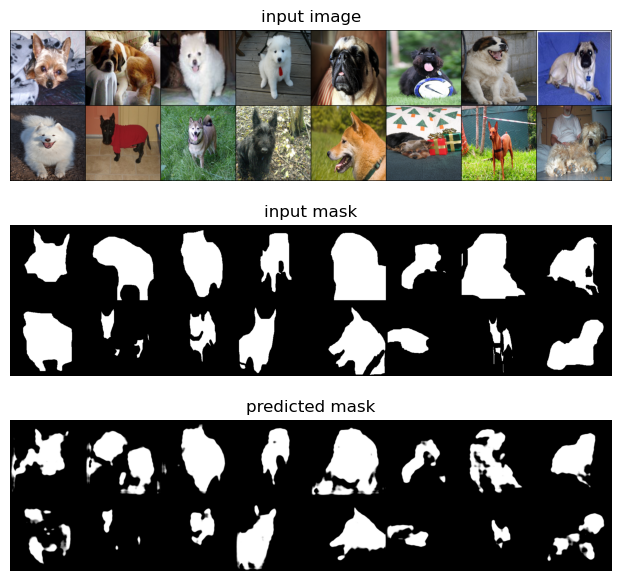

epochs - 20/30 [324/324], dice score: -0.1903703473772177, train loss: 0.21325437499233235, val loss: 0.2912821497419755


100%|██████████| 139/139 [00:04<00:00, 29.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.4690, -1.5994, -1.6456,  ..., -1.6643, -1.6109, -1.5227],
          [-1.4473, -1.3664, -1.4127,  ..., -1.4681, -1.2836, -1.4091],
          [-1.5618, -1.6340, -1.5986,  ..., -1.5384, -1.5026, -1.4333],
          ...,
          [-1.5415, -1.6053, -1.5829,  ..., -1.0368, -0.8713, -1.1328],
          [-1.5715, -1.4222, -1.4894,  ..., -0.7532, -0.6872, -1.0243],
          [-1.5427, -1.6116, -1.6116,  ..., -1.0925, -1.0534, -1.3082]]],


        [[[-1.4700, -1.6170, -1.6707,  ..., -1.6712, -1.6240, -1.5307],
          [-1.4493, -1.3834, -1.4312,  ..., -1.4743, -1.2980, -1.4140],
          [-1.5608, -1.6603, -1.6021,  ..., -1.5343, -1.5208, -1.4288],
          ...,
          [-1.5748, -1.6749, -1.6027,  ..., -1.5240, -1.5004, -1.3579],
          [-1.6099, -1.5059, -1.5404,  ..., -1.4233, -1.2595, -1.2689],
          [-1.5868, -1.6798, -1.6837,  ..., -1.5899, -1.4418, -1.5166]]],


        [[[-1.4701, -1.6171, -1.6702,  ..., -1.6794, -1.6460, -1.5385],
          [-1.4496, -1.383

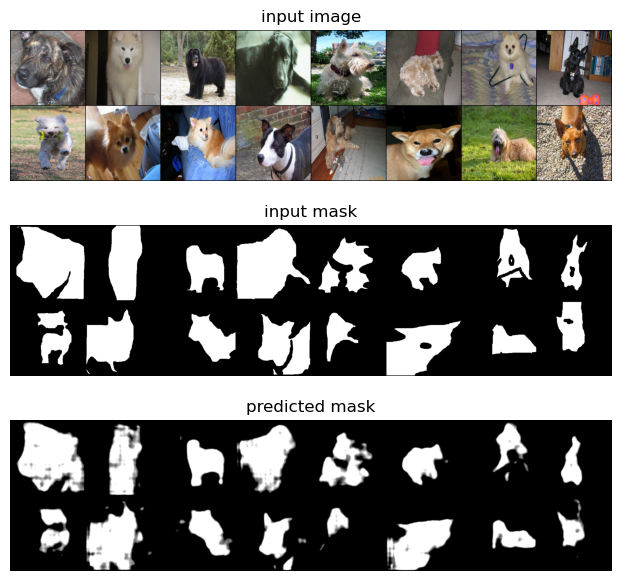

epochs - 21/30 [324/324], dice score: -1.161913345185973, train loss: 0.2033222483723988, val loss: 0.2915396031072671


100%|██████████| 139/139 [00:04<00:00, 29.30it/s]


tensor([[[[-1.4026, -1.6322, -1.7479,  ..., -1.7496, -1.7004, -1.4767],
          [-1.4532, -1.4542, -1.5568,  ..., -1.5248, -1.2920, -1.4572],
          [-1.5294, -1.5633, -1.6635,  ..., -1.4705, -1.3819, -1.4699],
          ...,
          [-1.5432, -1.5965, -1.6610,  ..., -1.5162, -1.2770, -1.3974],
          [-1.5262, -1.3601, -1.5228,  ..., -1.1945, -1.0484, -1.2737],
          [-1.4141, -1.4578, -1.5587,  ..., -1.4140, -1.2423, -1.6022]]],


        [[[-1.4115, -1.6904, -1.8243,  ..., -1.8692, -1.8315, -1.5695],
          [-1.4587, -1.5341, -1.6376,  ..., -1.6679, -1.5064, -1.5529],
          [-1.5611, -1.6569, -1.7621,  ..., -1.6773, -1.6597, -1.6005],
          ...,
          [-1.1131, -0.5785, -0.4151,  ..., -1.3970, -1.1813, -1.3433],
          [-1.0704, -0.5009, -0.4447,  ..., -1.1119, -0.9626, -1.2357],
          [-1.0872, -0.8552, -0.8455,  ..., -1.3506, -1.1954, -1.5757]]],


        [[[-1.4135, -1.6974, -1.8312,  ..., -1.8736, -1.8393, -1.5744],
          [-1.4580, -1.541

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


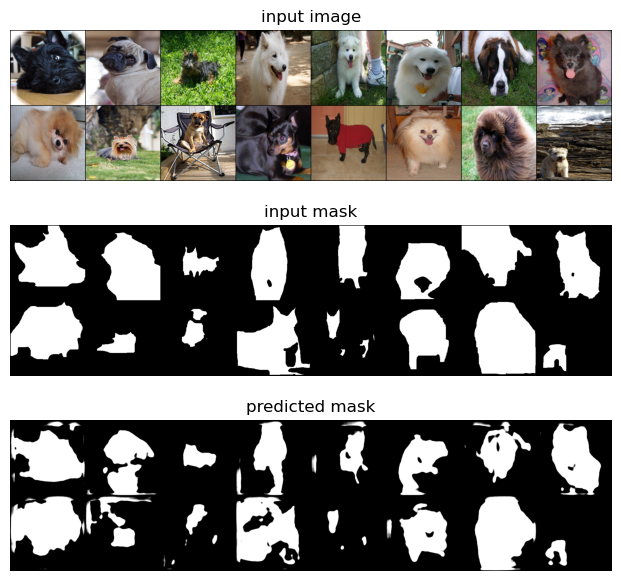

epochs - 22/30 [324/324], dice score: -0.7263854028080865, train loss: 0.19853718748983043, val loss: 0.31811767452054746


100%|██████████| 139/139 [00:04<00:00, 31.31it/s]


tensor([[[[-1.3158, -1.6956, -1.7825,  ..., -1.7896, -1.7124, -1.3535],
          [-1.3862, -1.6917, -1.6692,  ..., -1.7104, -1.5089, -1.4545],
          [-1.4575, -1.7265, -1.7048,  ..., -1.6580, -1.5289, -1.4213],
          ...,
          [-1.4971, -1.8250, -1.7797,  ..., -1.7373, -1.7034, -1.5073],
          [-1.4958, -1.5394, -1.6721,  ..., -1.6833, -1.4419, -1.3857],
          [-1.4061, -1.4840, -1.6203,  ..., -1.6669, -1.3411, -1.6205]]],


        [[[-1.3131, -1.6822, -1.7745,  ..., -1.8127, -1.7515, -1.3784],
          [-1.3808, -1.6826, -1.6697,  ..., -1.7167, -1.5685, -1.4804],
          [-1.4491, -1.7073, -1.6975,  ..., -1.6708, -1.5833, -1.4499],
          ...,
          [-1.4854, -1.8066, -1.7803,  ..., -1.7437, -1.6506, -1.4745],
          [-1.4802, -1.5012, -1.6540,  ..., -1.6254, -1.3428, -1.3450],
          [-1.3858, -1.4533, -1.5941,  ..., -1.5957, -1.2621, -1.5896]]],


        [[[-1.3110, -1.6697, -1.7649,  ..., -1.8167, -1.7573, -1.3821],
          [-1.3751, -1.671

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


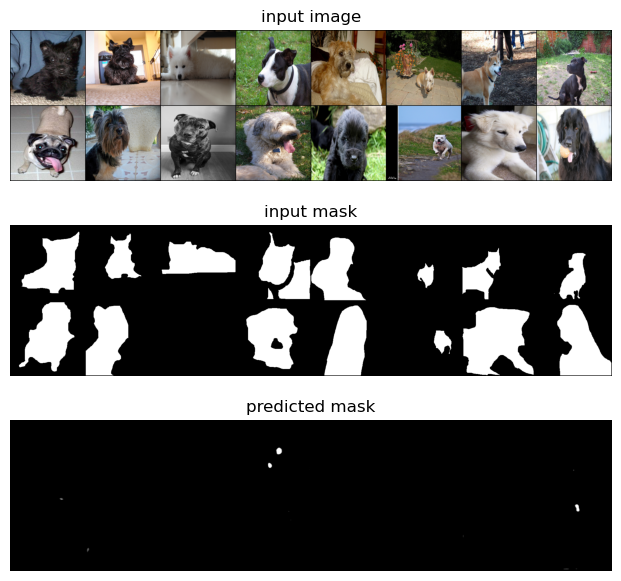

epochs - 23/30 [324/324], dice score: 0.5736038326788292, train loss: 0.1929889630848243, val loss: 2.1683345741505247


100%|██████████| 139/139 [00:04<00:00, 28.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.4353, -1.9224, -1.9662,  ..., -2.0074, -1.9359, -1.5980],
          [-1.7355, -2.0662, -1.9913,  ..., -1.9574, -1.8738, -1.6525],
          [-1.8397, -2.1119, -2.0169,  ..., -1.9068, -1.8276, -1.6108],
          ...,
          [-1.7694, -2.1059, -1.9193,  ..., -1.8753, -1.8305, -1.5325],
          [-1.7373, -1.8972, -1.8465,  ..., -1.8549, -1.6258, -1.4452],
          [-1.5637, -1.6383, -1.6620,  ..., -1.6662, -1.4170, -1.4405]]],


        [[[-1.4344, -1.9208, -1.9646,  ..., -2.0066, -1.9349, -1.5972],
          [-1.7344, -2.0655, -1.9896,  ..., -1.9565, -1.8732, -1.6519],
          [-1.8382, -2.1096, -2.0140,  ..., -1.9064, -1.8262, -1.6103],
          ...,
          [-1.7277, -2.0577, -1.8910,  ..., -1.8645, -1.8201, -1.5252],
          [-1.6988, -1.8372, -1.8024,  ..., -1.8480, -1.6105, -1.4443],
          [-1.5331, -1.5933, -1.6294,  ..., -1.6554, -1.4123, -1.4404]]],


        [[[-1.4175, -1.8854, -1.9351,  ..., -1.9979, -1.9263, -1.5886],
          [-1.7103, -2.053

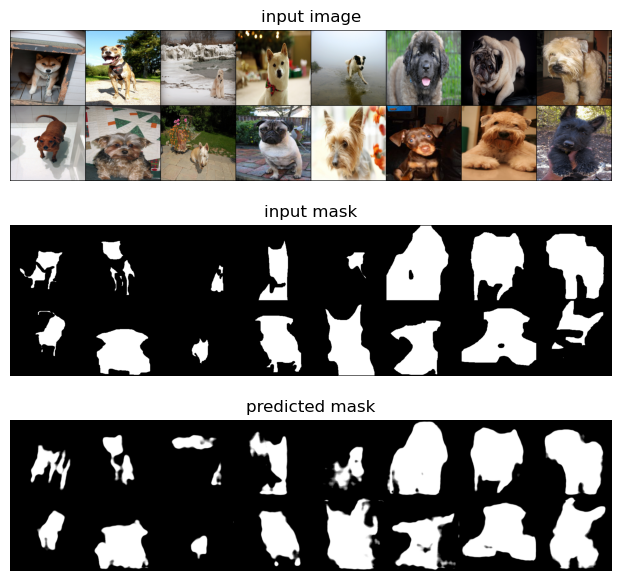

epochs - 24/30 [324/324], dice score: -1.0564489855611925, train loss: 0.19003736167962168, val loss: 0.242069144150336


100%|██████████| 139/139 [00:04<00:00, 30.67it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.3527, -1.8450, -1.7837,  ..., -1.8142, -1.7526, -1.7869],
          [-1.6904, -1.6820, -1.6937,  ..., -1.7817, -1.6242, -1.7131],
          [-1.9226, -1.9422, -2.0119,  ..., -1.9342, -1.6737, -1.7598],
          ...,
          [-1.6772, -1.6818, -1.5629,  ..., -1.1295, -1.0793, -1.2681],
          [-1.7231, -1.6605, -1.5758,  ..., -1.0064, -0.9696, -1.2458],
          [-1.5180, -1.2864, -1.3002,  ..., -0.9328, -0.8687, -1.1708]]],


        [[[-1.3478, -1.8379, -1.7723,  ..., -1.8115, -1.7475, -1.7836],
          [-1.6828, -1.6727, -1.6769,  ..., -1.7709, -1.6189, -1.7071],
          [-1.9074, -1.9209, -1.9675,  ..., -1.9106, -1.6612, -1.7500],
          ...,
          [-1.1828, -1.0802, -0.9935,  ..., -1.4725, -1.3618, -1.4224],
          [-1.2985, -1.0044, -0.9558,  ..., -1.3348, -1.2242, -1.3912],
          [-1.1892, -0.9295, -0.8973,  ..., -1.1885, -1.0377, -1.2589]]],


        [[[-1.3521, -1.8443, -1.7823,  ..., -1.8121, -1.7480, -1.7838],
          [-1.6887, -1.680

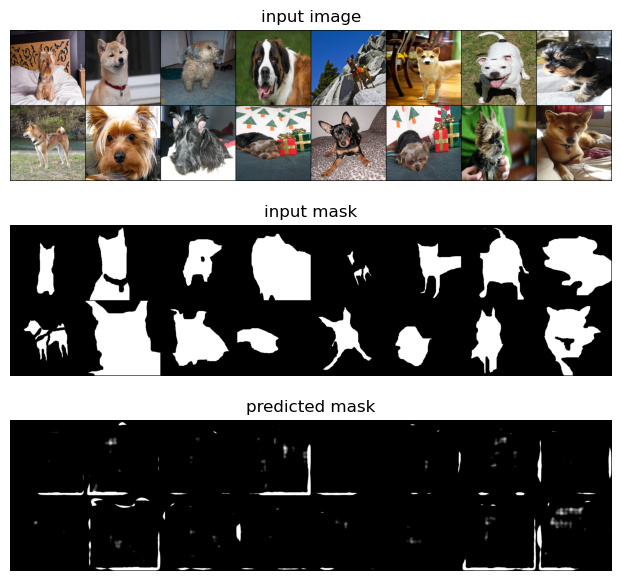

epochs - 25/30 [324/324], dice score: 0.28851485745512323, train loss: 0.17774498177531325, val loss: 0.8850028193254265


100%|██████████| 139/139 [00:04<00:00, 31.19it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.6635, -1.8319, -1.8148,  ..., -1.9102, -1.8302, -1.9110],
          [-2.0160, -1.8632, -1.7308,  ..., -1.8111, -1.7899, -1.8435],
          [-2.1314, -1.9818, -1.9737,  ..., -1.9285, -1.7959, -1.8811],
          ...,
          [-2.1284, -2.0051, -1.9606,  ..., -1.7316, -1.6697, -1.6985],
          [-2.0718, -1.9952, -2.0241,  ..., -1.7978, -1.6781, -1.6239],
          [-1.8757, -1.6322, -1.7362,  ..., -1.4967, -1.3663, -1.4712]]],


        [[[-1.6599, -1.8268, -1.8075,  ..., -1.9005, -1.8206, -1.9023],
          [-2.0100, -1.8576, -1.7214,  ..., -1.7923, -1.7806, -1.8377],
          [-2.1225, -1.9741, -1.9625,  ..., -1.9058, -1.7879, -1.8697],
          ...,
          [-1.8736, -1.6144, -1.5389,  ..., -1.8206, -1.7605, -1.7491],
          [-1.8668, -1.6500, -1.6074,  ..., -1.9021, -1.7662, -1.6826],
          [-1.7664, -1.3916, -1.4237,  ..., -1.5874, -1.4319, -1.5135]]],


        [[[-1.6594, -1.8258, -1.8056,  ..., -1.9079, -1.8280, -1.9090],
          [-2.0095, -1.854

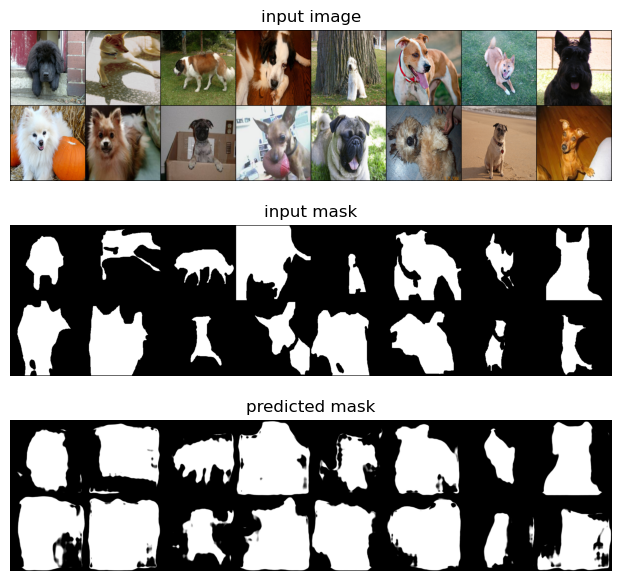

epochs - 26/30 [324/324], dice score: 2.728014548047841, train loss: 0.18095605953791996, val loss: 0.67893417447591


100%|██████████| 139/139 [00:04<00:00, 29.23it/s]


tensor([[[[-1.3751, -1.4171, -1.4959,  ..., -1.6129, -1.4766, -1.5170],
          [-1.5841, -1.5935, -1.7156,  ..., -1.7382, -1.6329, -1.5835],
          [-1.6227, -1.7048, -1.8491,  ..., -1.8658, -1.6947, -1.6253],
          ...,
          [-1.2532, -0.9506, -0.9055,  ..., -0.5255, -0.6896, -0.9731],
          [-1.2320, -0.9121, -0.9281,  ..., -0.5105, -0.6448, -0.8599],
          [-1.2350, -0.9668, -0.9874,  ..., -0.7051, -0.7569, -0.9675]]],


        [[[-1.3703, -1.4089, -1.4853,  ..., -1.5977, -1.4643, -1.5093],
          [-1.5762, -1.5787, -1.6985,  ..., -1.7161, -1.6119, -1.5696],
          [-1.6114, -1.6852, -1.8257,  ..., -1.8361, -1.6645, -1.6051],
          ...,
          [-1.5618, -1.5030, -1.6325,  ..., -1.6302, -1.5186, -1.4452],
          [-1.4796, -1.3927, -1.5391,  ..., -1.5327, -1.4316, -1.2928],
          [-1.3863, -1.2583, -1.3702,  ..., -1.3286, -1.2206, -1.2091]]],


        [[[-1.3732, -1.4146, -1.4925,  ..., -1.5826, -1.4533, -1.5023],
          [-1.5811, -1.588

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


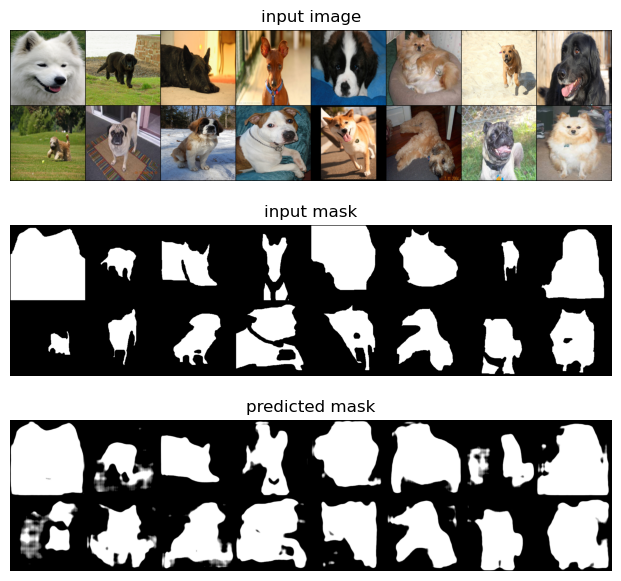

epochs - 27/30 [324/324], dice score: 2.1832971890195667, train loss: 0.17654438983695006, val loss: 0.5333260934558703


100%|██████████| 139/139 [00:04<00:00, 30.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-1.1132, -0.9867, -1.3268,  ..., -1.4626, -1.1182, -1.2170],
          [-1.2239, -1.2594, -1.6120,  ..., -1.6488, -1.2360, -1.1785],
          [-1.3922, -1.4756, -1.8138,  ..., -1.8353, -1.3781, -1.2679],
          ...,
          [-1.2928, -1.3439, -1.6041,  ..., -1.5883, -1.1925, -1.0562],
          [-1.0888, -0.9665, -1.3400,  ..., -1.2821, -0.8351, -0.8048],
          [-1.0920, -0.8766, -1.0405,  ..., -1.0356, -0.6974, -0.8508]]],


        [[[-1.1176, -0.9952, -1.3369,  ..., -1.4583, -1.1143, -1.2144],
          [-1.2322, -1.2751, -1.6261,  ..., -1.6417, -1.2288, -1.1739],
          [-1.4016, -1.4905, -1.8313,  ..., -1.8270, -1.3715, -1.2623],
          ...,
          [-1.3688, -1.4659, -1.7589,  ...,  0.9363,  0.9132,  0.2713],
          [-1.1473, -1.0784, -1.4666,  ...,  0.9820,  0.8955,  0.2682],
          [-1.1246, -0.9406, -1.1237,  ...,  0.5407,  0.4109, -0.1936]]],


        [[[-1.1158, -0.9919, -1.3332,  ..., -1.3909, -1.0566, -1.1796],
          [-1.2289, -1.269

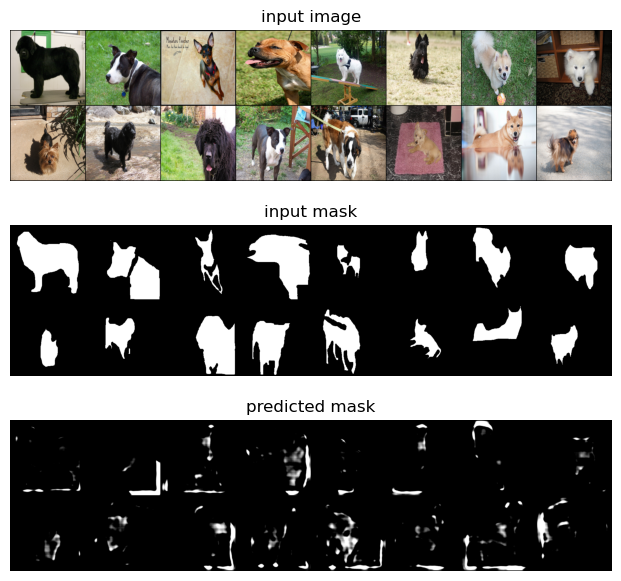

epochs - 28/30 [324/324], dice score: 0.2680236647883765, train loss: 0.1672297653592663, val loss: 0.4706099736604759


100%|██████████| 139/139 [00:04<00:00, 29.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.8444, -0.7729, -1.2275,  ..., -1.4804, -1.0501, -1.0348],
          [-0.8889, -1.0711, -1.6098,  ..., -1.8003, -1.3656, -1.1015],
          [-1.1114, -1.3853, -1.9202,  ..., -2.0525, -1.5674, -1.2569],
          ...,
          [-1.1422, -1.4228, -1.8692,  ..., -1.9688, -1.4694, -1.1296],
          [-0.8983, -1.0049, -1.4689,  ..., -1.5381, -1.0558, -0.8371],
          [-0.8331, -0.7835, -0.9938,  ..., -1.0348, -0.6930, -0.6072]]],


        [[[-0.8433, -0.7707, -1.2259,  ..., -1.4785, -1.0487, -1.0335],
          [-0.8874, -1.0678, -1.6078,  ..., -1.7983, -1.3634, -1.1002],
          [-1.1100, -1.3831, -1.9188,  ..., -2.0500, -1.5657, -1.2563],
          ...,
          [-1.1378, -1.4166, -1.8606,  ..., -1.9511, -1.4465, -1.1089],
          [-0.8937, -0.9964, -1.4588,  ..., -1.5210, -1.0337, -0.8217],
          [-0.8298, -0.7760, -0.9836,  ..., -1.0216, -0.6793, -0.5977]]],


        [[[-0.8470, -0.7781, -1.2343,  ..., -1.4675, -1.0379, -1.0264],
          [-0.8926, -1.079

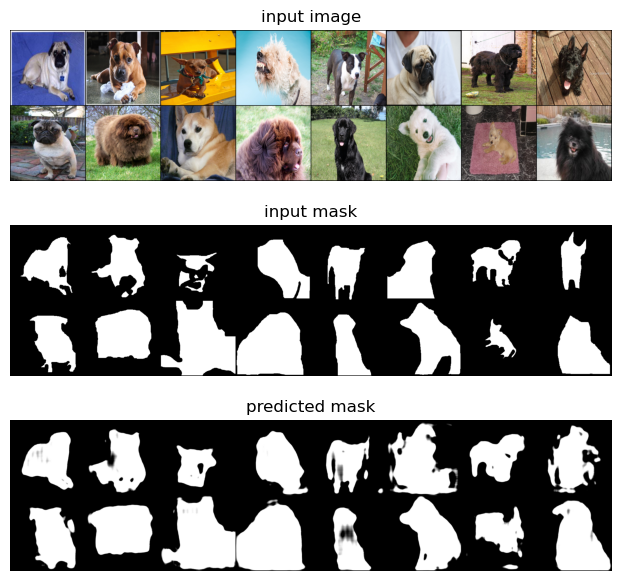

epochs - 29/30 [324/324], dice score: -7.090690052766594, train loss: 0.15989107877751926, val loss: 0.3729776558901766


100%|██████████| 139/139 [00:04<00:00, 30.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[-0.8880, -1.2012, -1.3798,  ..., -1.4348, -1.1302, -1.0327],
          [-1.0973, -1.5172, -1.6874,  ..., -1.6395, -1.3420, -1.0846],
          [-1.2800, -1.7065, -1.9005,  ..., -1.8109, -1.4495, -1.1701],
          ...,
          [-1.3676, -1.8283, -1.9806,  ..., -2.0549, -1.8508, -1.4406],
          [-1.2038, -1.5658, -1.7746,  ..., -1.7833, -1.4786, -1.1779],
          [-0.9973, -1.0964, -1.2474,  ..., -1.2593, -1.0427, -0.8626]]],


        [[[-0.8771, -1.1950, -1.3658,  ..., -1.4137, -1.1069, -1.0190],
          [-1.0764, -1.4921, -1.6559,  ..., -1.5982, -1.2986, -1.0516],
          [-1.2535, -1.6723, -1.8689,  ..., -1.7698, -1.4043, -1.1347],
          ...,
          [-1.3549, -1.7889, -1.9208,  ..., -1.8593, -1.8226, -1.3614],
          [-1.1979, -1.5271, -1.7157,  ..., -1.7593, -1.4462, -1.1252],
          [-1.0002, -1.0860, -1.2526,  ..., -1.3066, -1.0643, -0.8349]]],


        [[[-0.8659, -1.1833, -1.3499,  ..., -1.4055, -1.0982, -1.0137],
          [-1.0573, -1.467

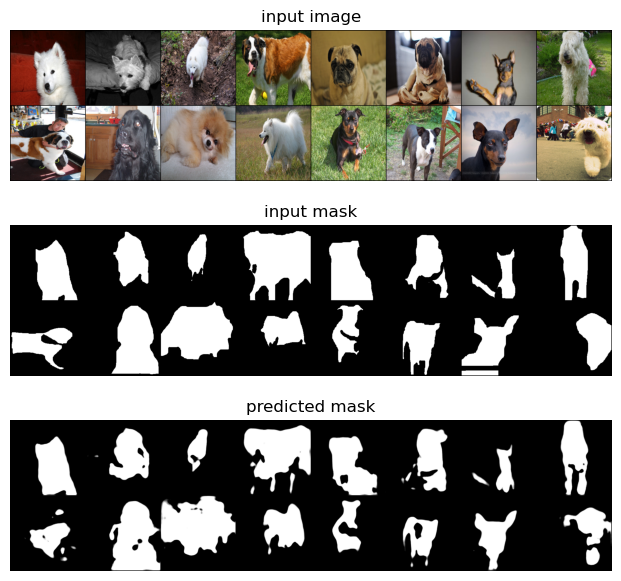

epochs - 30/30 [324/324], dice score: -2.215326205003176, train loss: 0.1614436053291515, val loss: 0.26106218286126637


In [9]:
model = UNet(in_channels=3, out_channels=1).to(device)
criterion = nn.BCEWithLogitsLoss()
# criterion = smp.losses.DiceLoss(mode='binary')
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

history = train(model, optimizer, criterion)